In [1]:
import os
import sys
sys.path.append('/home/el2522/.local/lib/python3.8/site-packages')
import pandas as pd
import numpy as np
import shap
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import StandardScaler,  MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import RFECV

pd.set_option('display.max_columns', None)

import random
import itertools
from sklearn.model_selection import KFold
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import TensorDataset, DataLoader
from torch.optim.lr_scheduler import StepLR

import scipy.stats as stats
from scipy.stats import mannwhitneyu, ttest_ind, chi2_contingency, fisher_exact, shapiro
import statsmodels.api as sm
import pickle
np.random.seed(66)
sys.path.append('/data/master/DS217/users/el2522')


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [3]:
# Load the data
data_dir = '/data/master/DS217/users/el2522/'
file_path = os.path.join(data_dir, 'ventDataPrep/intermediate/df_validated.pkl')
df = pd.read_pickle(file_path)

## Feature Engineering

In [4]:
df.columns

Index(['encounterId', 'utcChartTime', 'gender', 'weight', 'hospital', 'PIM',
       'MAP', 'TV(measured)', 'RR(measured)', 'etCO2', 'temp', 'HR', 'SpO2',
       'systolicBP', 'meanBP', 'diastolicBP', 'pH', 'PCO2', 'baseExcess',
       'lactate', 'HCO3', 'WBC', 'Neutrophil', 'Hb', 'fluidBalance', 'NMB',
       'sedation', 'furosemide', 'vasoActive', 'steroid', 'FiO2', 'PIP',
       'RR(set)', 'PEEP(set)', 'inspTime', 'PS+PEEP', 'ifDeceased', 'LOV',
       'LOS', 'timestamp', 'age_group', 'ventMode_NIV', 'ventMode_NoSupport',
       'ventMode_PC', 'ventMode_PS', 'airwayStatus_Extubated',
       'airwayStatus_Intubated', 'airwayStatus_TubeKeptIn',
       'airwayStatus_TubeKeptOut', 'SFRatio', 'PS', 'TVbyWeight', 'RRRatio',
       'IERatio', 'deltaP', 'mPower', 'diagnosis', 'ethnicity'],
      dtype='object')

In [5]:
df = pd.get_dummies(df, columns=['diagnosis', 'ethnicity'])

In [6]:
# define vars
demo_cols = ['gender','age_group', 'weight', 'PIM'] + [x for x in df.columns if 
                                            x.startswith(('ethnicity', 'diagnosis'))]

age_dependent_cols = ['HR', 'systolicBP', 'meanBP', 'diastolicBP']

categoric_cols = ['NMB', 'sedation', 'furosemide', 'vasoActive', 'steroid', 'ventMode_PC', 'ventMode_PS']

numerical_cols = ['timestamp', 'MAP','RR(measured)', 'etCO2', 'temp', 'HR', 'SpO2',
       'systolicBP', 'meanBP', 'diastolicBP', 'pH', 'PCO2', 'baseExcess',
       'lactate', 'HCO3', 'WBC', 'Neutrophil', 'Hb', 'fluidBalance', 'FiO2', 'PIP',
       'RR(set)', 'PEEP(set)', 'inspTime', 'PS', 'TVbyWeight', 'RRRatio',
       'IERatio', 'deltaP', 'mPower', 'SFRatio']

physio_measure = ['timestamp', 'gender', 'age_group', 'weight', 'RR(measured)', 'temp', 'HR', 'SpO2', 'systolicBP',
       'meanBP', 'diastolicBP', 'pH', 'PCO2', 'baseExcess', 'lactate', 'HCO3', 'WBC',
       'Neutrophil', 'Hb', 'fluidBalance']

In [7]:
# Convert data type
for col in categoric_cols+['gender','age_group']+[x for x in df.columns if 
                                            x.startswith(('ethnicity', 'diagnosis'))]:
    df[col] = df[col].astype('int')

# Round the timestamp to the nearest whole number and then convert to int
df[['timestamp', 'LOV']] = np.round(df[['timestamp', 'LOV']]).astype(int)
    
# Identify the timestep of the first instance of NIV or NoSupport for each encounterId:
first_extubation_time = df.groupby('encounterId').apply(
    lambda group: group[(group['airwayStatus_Extubated'] == 1)]['timestamp'].min() 
                  if not group[(group['airwayStatus_Extubated'] == 1)]['timestamp'].empty 
                  else group['timestamp'].iloc[-1]
)
df['first_extubation_time'] = df['encounterId'].map(first_extubation_time)

print('LOV is less than 6 hours:', df.groupby('encounterId').filter(lambda x: x.LOV.iloc[0]<=6).encounterId.nunique())
df = df.groupby('encounterId').filter(lambda x: x.LOV.iloc[0]>6)


LOV is less than 6 hours: 604


In [8]:
def compute_outcomes_with_censoring(group):
    group.set_index('timestamp', inplace=True)
    
    # Identify the timestep of the first instance of NIV or NoSupport for each encounterId:
    vent_start = group[group.airwayStatus_Intubated==1].first_valid_index()
    vent_end = group[group.airwayStatus_Extubated==1].last_valid_index()
    
    # Censoring indicator
    # It's event (0) if we don't have a complete 48-hour observation window post-extubation,

    if (vent_end is None) | (group[['airwayStatus_Intubated', 'airwayStatus_TubeKeptIn']].iloc[-1].sum()!=0):
        if group['ifDeceased'].iloc[0]==1:
            event_description = 'Not Extubated - Deceased'
        else:
            event_description = 'Not Extubated - Alive'
    elif (group['airwayStatus_TubeKeptOut'].iloc[-48:].sum()!=48):
        if group['ifDeceased'].iloc[0]==1:
            event_description = 'No 48h Observation - Deceased'
        else:
            event_description = f'No 48h Observation - Alive'
    elif group['airwayStatus_TubeKeptOut'].iloc[-48:].sum()==48:
        event_description = "Successful Extubation"
        
    num_intub = group.airwayStatus_Intubated.sum()

    return pd.Series({
        'vent_start_time': int(vent_start),
        'vent_end_time': int(vent_end) if not event_description.startswith('Not Extubated') else int(group.index[-1]),
        'num_intub': int(num_intub),
        'event_description': event_description,
    })

# Apply function and merge results
vent_outcome = df.groupby('encounterId').apply(compute_outcomes_with_censoring).reset_index()
df = df.merge(vent_outcome, on='encounterId', how='left')


In [9]:
vent_outcome.groupby('num_intub').event_description.value_counts()

num_intub  event_description            
1          No 48h Observation - Alive       2259
           Successful Extubation            1746
           Not Extubated - Alive             276
           Not Extubated - Deceased          116
           No 48h Observation - Deceased      15
2          Successful Extubation             197
           No 48h Observation - Alive         96
           Not Extubated - Alive              13
           Not Extubated - Deceased            8
           No 48h Observation - Deceased       2
3          Successful Extubation              22
           No 48h Observation - Alive          8
           Not Extubated - Deceased            2
4          Successful Extubation               6
           No 48h Observation - Alive          1
           Not Extubated - Alive               1
           Not Extubated - Deceased            1
Name: count, dtype: int64

In [10]:
# Open the file for reading
with open('EF_test_data_record.pkl', 'rb') as file:
    EF_data = pickle.load(file)

EF_id_list = EF_data['encounterId']


In [11]:
df_pred = df.copy()
df_pred['time_to_event'] = df_pred.groupby('encounterId').apply(
    lambda x: (x.timestamp.max()-x.timestamp).astype(int)).reset_index(drop=True)
df_pred['time_to_final_weaning'] = (df_pred.vent_end_time-df_pred.timestamp).astype(int)
df_pred['extubation_ready'] = (df_pred['time_to_final_weaning'] <= 24).astype(int) 
df_pred = df_pred[(df_pred.timestamp > df_pred.vent_start_time)]
df_pred = df_pred[(df_pred.time_to_final_weaning<=24*28)]


df_ef = df_pred[df_pred.encounterId.isin(EF_id_list)]
df_ef['encounterId_ordered'] = pd.Categorical(df_ef['encounterId'], categories=EF_id_list, ordered=True)
df_ef = df_ef.sort_values('encounterId_ordered')
df_ef.drop('encounterId_ordered', axis=1, inplace=True)  # Optional: drop the helper column

df_pred_without_failure = df_pred[(~df_pred.encounterId.isin(EF_id_list)) & 
                                  (df_pred.num_intub==1) & (~df_pred.event_description.str.contains('Deceased'))]
df_pred_with_failure = df_pred[(~df_pred.encounterId.isin(EF_id_list)) & 
                               (df_pred.num_intub>1)|(df_pred.event_description.str.contains('Deceased'))]


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


### Observations

In [86]:
df_demo_without_failure = df_pred_without_failure[demo_cols+['event_description']].drop_duplicates()
# Reverse one-hot encoding for diagnosis
diagnosis_cols = [x for x in df_demo_without_failure.columns if x.startswith('diagnosis')]
df_demo_without_failure['diagnosis'] = df_demo_without_failure[diagnosis_cols].idxmax(axis=1)
df_demo_without_failure['diagnosis'] = df_demo_without_failure['diagnosis'].str.replace('diagnosis_', '')

# Reverse one-hot encoding for ethnicity
ethnicity_cols = [x for x in df_demo_without_failure.columns if x.startswith('ethnicity')]
df_demo_without_failure['ethnicity'] = df_demo_without_failure[ethnicity_cols].idxmax(axis=1)
df_demo_without_failure['ethnicity'] = df_demo_without_failure['ethnicity'].str.replace('ethnicity_', '')

# Drop the original one-hot encoded columns
df_demo_without_failure.drop(columns=diagnosis_cols + ethnicity_cols, inplace=True)


### the PIM score suggests that the "not extubated" patients might be more severe ones

In [87]:
df_demo_without_failure.groupby('event_description')[['gender', 'age_group', 'weight', 'PIM']].agg(['count', 'mean', 'std']
                                                                                                   )

gender                     age_group            \
                            count      mean       std     count      mean   
event_description                                                           
No 48h Observation - Alive   1795  0.568802  0.495382      1795  2.916435   
Not Extubated - Alive         276  0.507246  0.500856       276  1.818841   
Successful Extubation        1391  0.560029  0.496562      1391  2.520489   

                                     weight                         PIM  \
                                 std  count       mean        std count   
event_description                                                         
No 48h Observation - Alive  1.811869   1795  13.599398  14.170766  1795   
Not Extubated - Alive       1.628097    276   7.657022  14.500281   276   
Successful Extubation       1.855027   1391  11.414394  13.009934  1391   

                                                
                                mean       std  
event_description                               
No 48h Observation - Alive  0.033851  0.048198  
Not Extubated - Alive       0.096280  0.100852  
Successful Extubation       0.045900  0.063955

In [89]:
df_demo_without_failure.groupby('event_description')['diagnosis'].value_counts()

event_description           diagnosis       
No 48h Observation - Alive  cardiovascular      623
                            respiratory         564
                            neurological        276
                            others              220
                            infection            87
                            gastrointestinal     25
Not Extubated - Alive       cardiovascular      201
                            others               28
                            respiratory          28
                            neurological         11
                            gastrointestinal      4
                            infection             4
Successful Extubation       cardiovascular      835
                            respiratory         288
                            others              139
                            neurological         68
                            infection            42
                            gastrointestinal     19
Name: count, dtype:

In [90]:
df_demo_without_failure.groupby('event_description')['ethnicity'].value_counts()

event_description           ethnicity                      
No 48h Observation - Alive  white or white british             845
                            asian or asian british             333
                            others                             277
                            black or black british             237
                            mixed or multiple ethnic groups    103
Not Extubated - Alive       others                             133
                            white or white british              78
                            asian or asian british              28
                            black or black british              27
                            mixed or multiple ethnic groups     10
Successful Extubation       white or white british             607
                            others                             314
                            asian or asian british             239
                            black or black british             157
  

In [91]:
action_cols = ['FiO2', 'PIP', 'RR(set)', 'PEEP(set)', 'inspTime', 'PS']
vent_cols = ['MAP', 'RR(measured)', 'etCO2','RRRatio', 'deltaP', 'mPower', 'SFRatio']

numerical_obs_cols_tmp = [x for x in numerical_cols if 
                          x not in ['timestamp'] and x not in action_cols+vent_cols]
numerical_cols_tmp = [x for x in numerical_cols if 
                          x not in ['timestamp']]
# categoric_cols_tmp = [x for x in categoric_cols if x not in 
#                       [x for x in df.columns if x.startswith('ventMode')]]
categoric_cols_tmp = categoric_cols

In [92]:

def plot_grouped_feature_variation(df, group_column, numerical_cols, categorical_cols, hours_col, y_scaler=None):
    """
    Plot the variation of numerical and categorical features grouped by a specified column over time.
    
    Parameters:
    - df: DataFrame containing the data.
    - group_column: The name of the column to group data by.
    - numerical_cols: List of names of numerical columns to plot.
    - categorical_cols: List of names of categorical columns to plot.
    - hours_col: The name of the column representing time/hours for the x-axis.
    """
    
    n_numerical = len(numerical_cols)
    n_categorical = len(categorical_cols)
    n_vars = n_numerical + n_categorical
    n_cols = 4
    n_rows = (n_vars + n_cols - 1) // n_cols

    plt.figure(figsize=(16, 4 * n_rows))

    # Handle the case when group_column is None
    if group_column:
        groups = df[group_column].unique()
        colors = plt.cm.rainbow(np.linspace(0, 1, len(groups)))
    else:
        groups = [None]  # Use a single group
        colors = ['blue']  # Use a single color

    # Determine global y-axis limits for numerical data if same_scale is True
    if y_scaler != None:
        global_min = y_scaler[0]
        global_max = y_scaler[1]
        df[numerical_cols] = df[numerical_cols].clip(global_min, global_max) 
        
    # Plot for numerical columns
    for i, var in enumerate(numerical_cols, 1):
        ax = plt.subplot(n_rows, n_cols, i)
        for group, color in zip(groups, colors):
            if group_column:
                grouped = df[df[group_column] == group].groupby(hours_col)[var].agg(['mean', 'std'])
            else:
                grouped = df.groupby(hours_col)[var].agg(['mean', 'std'])
            ax.plot(grouped.index, grouped['mean'], label=f"{group}", color=color)
            ax.fill_between(grouped.index, grouped['mean'] - grouped['std'], grouped['mean'] + grouped['std'], alpha=0.2, color=color)
        ax.set_xlabel(f'{hours_col}')
        ax.set_ylabel(var)
        ax.set_title(f'{var} over {hours_col}')
        ax.invert_xaxis()
        ax.axvline(x=0, color='#cccc', linestyle='--', linewidth=1)
        
        # Set the same y-axis scale for all numerical plots
        if y_scaler != None:
            ax.set_ylim(global_min, global_max)
            
    # Plot for categorical columns
    for i, var in enumerate(categorical_cols, 1 + n_numerical):
        ax = plt.subplot(n_rows, n_cols, i)
        for group, color in zip(groups, colors):
            if group_column:
                grouped = df[df[group_column] == group].groupby(hours_col)[var].mean()
            else:
                grouped = df.groupby(hours_col)[var].mean()
            ax.plot(grouped.index, grouped, label=f"{group}", color=color)
        ax.set_xlabel(f'{hours_col}')
        ax.set_ylabel(f'Proportion of {var}')
        ax.set_title(f'{var} over {hours_col}')
        ax.invert_xaxis()
        ax.axvline(x=0, color='#cccc', linestyle='--', linewidth=1)
        
    plt.tight_layout()
    if group_column:
        handles, labels = ax.get_legend_handles_labels()
        plt.figlegend(handles, labels, loc='upper right', bbox_to_anchor=(1.15, 1), title=group_column)
    plt.show()

    

In [17]:
df_pred_without_failure[df_pred_without_failure.LOV>300].encounterId.unique()

array(['10168', '11010', '11361', '12081', '12113', '12627', '13313',
       '13608', '13717', '13881', '14001', '14334', '14371', '15484',
       '15836', '15886', '15967', '16489', '16523', '16945', '17024',
       '1724', '17441', '17562', '17721', '17900', '18330', '18451',
       '22005', '26340', '27271', '27407', '2883', '28863', '29296',
       '29299', '31670', '3394', '4263', '4360', '4664', '4734', '4744',
       '4837', '5322', '6069', '6888', '7117', '7333', '7618', '7996',
       '8088', '8168', '8373', '8462', '8463', '8521', '9807',
       'NIC:1020414:1733189400', 'NIC:1026721:1741204800',
       'NIC:1036357:1754467200', 'NIC:1052344:1765648200',
       'NIC:1053934:1765911600', 'NIC:1055598:1772784000',
       'NIC:1056214:1767897000', 'NIC:1064438:1778097000',
       'NIC:1071028:1784568600', 'NIC:1071256:1783272600',
       'NIC:1071621:1797173400', 'NIC:1074476:1808243700',
       'NIC:1077988:1800919920', 'NIC:1078470:1790099880',
       'NIC:1082685:1794483960',

In [18]:
df_pred_without_failure.loc[df_pred_without_failure.encounterId=='NIC:1142983:1851896100', demo_cols]

,gender,age_group,weight,PIM,diagnosis_cardiovascular,diagnosis_gastrointestinal,diagnosis_infection,diagnosis_neurological,diagnosis_others,diagnosis_respiratory,ethnicity_asian or asian british,ethnicity_black or black british,ethnicity_mixed or multiple ethnic groups,ethnicity_others,ethnicity_white or white british
404040,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404041,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404042,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404043,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404044,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404580,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404581,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404582,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0
404583,0,2,5.2,0.050054,1,0,0,0,0,0,0,0,0,1,0


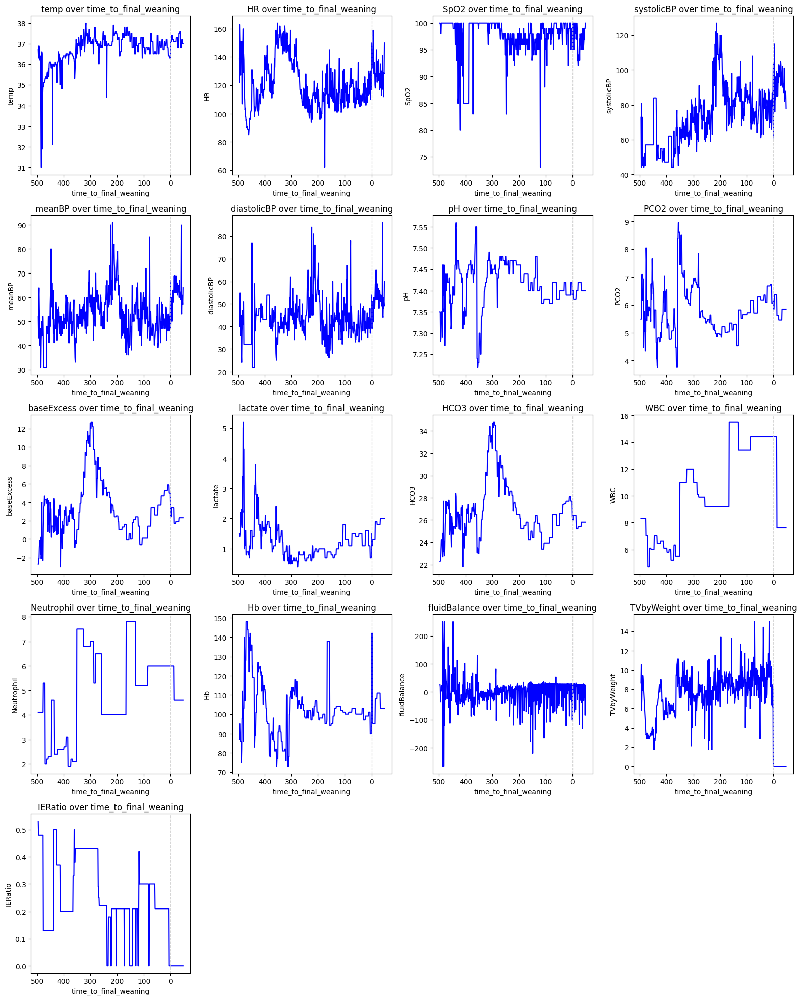

In [93]:

plot_grouped_feature_variation(
    df=df_pred_without_failure.loc[df_pred_without_failure.encounterId=='NIC:1142983:1851896100'], 
    group_column=None, 
    numerical_cols=numerical_obs_cols_tmp, 
    categorical_cols=[], 
    hours_col='time_to_final_weaning'
)

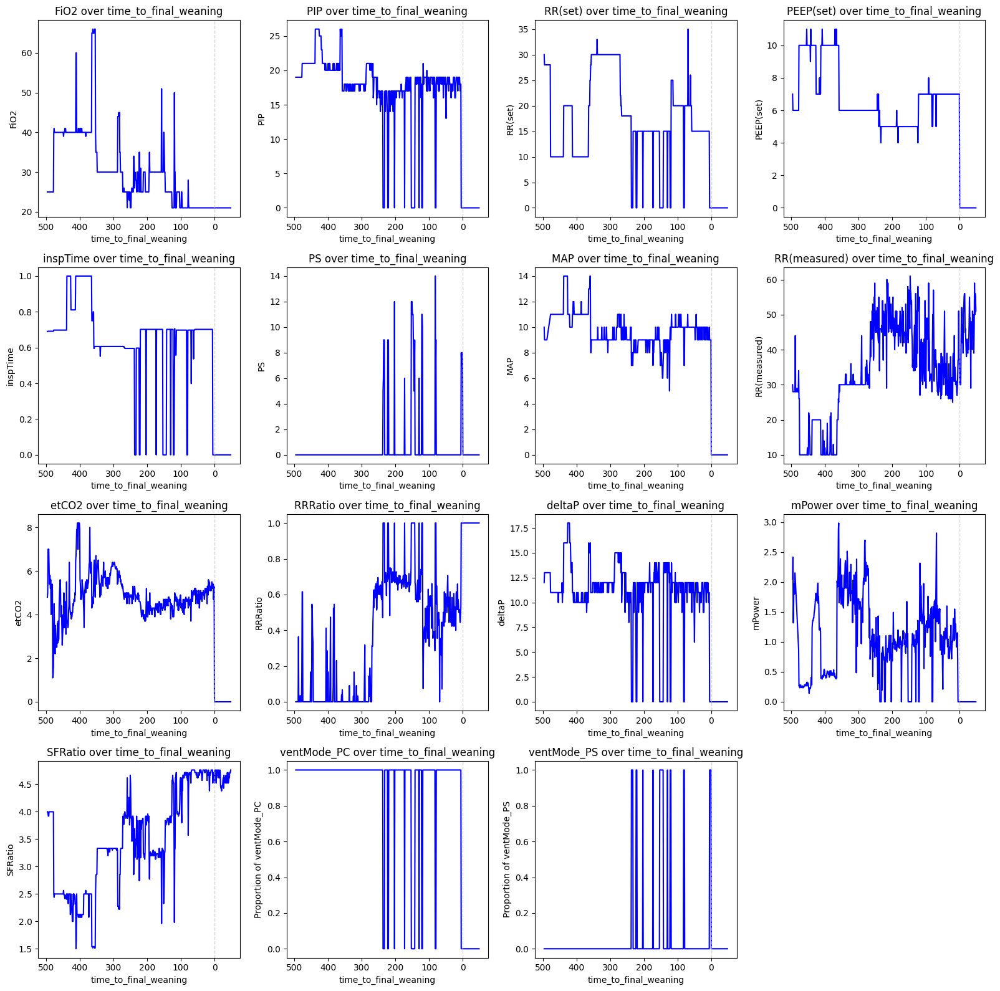

In [20]:

plot_grouped_feature_variation(
    df=df_pred_without_failure.loc[df_pred_without_failure.encounterId=='NIC:1142983:1851896100'], 
    group_column=None, 
    numerical_cols=action_cols+vent_cols, 
    categorical_cols=['ventMode_PC', 'ventMode_PS'], 
    hours_col='time_to_final_weaning'
)

### We can see systematic and significant difference on interventions, why? The effect is especially obvious on "Not Extubated" group

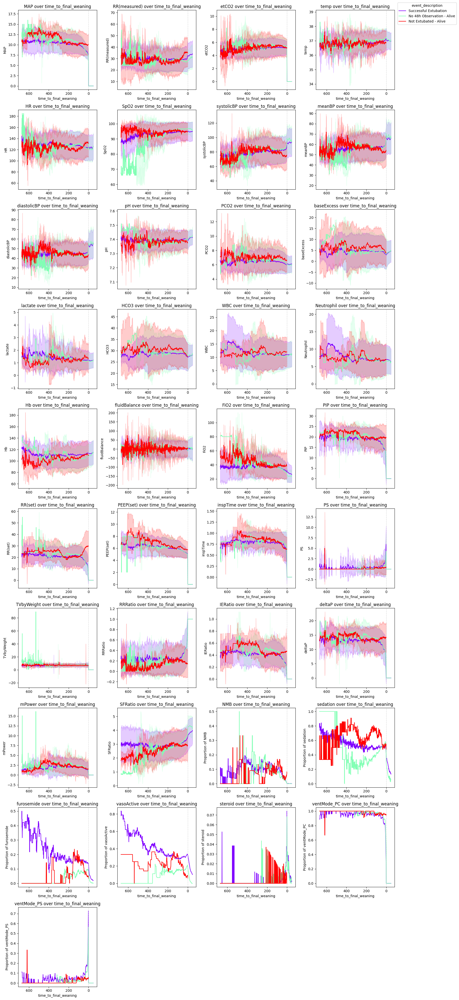

In [21]:

plot_grouped_feature_variation(
    df=df_pred_without_failure, 
    group_column='event_description', 
    numerical_cols=numerical_cols_tmp, 
    categorical_cols=categoric_cols_tmp, 
    hours_col='time_to_final_weaning'
)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


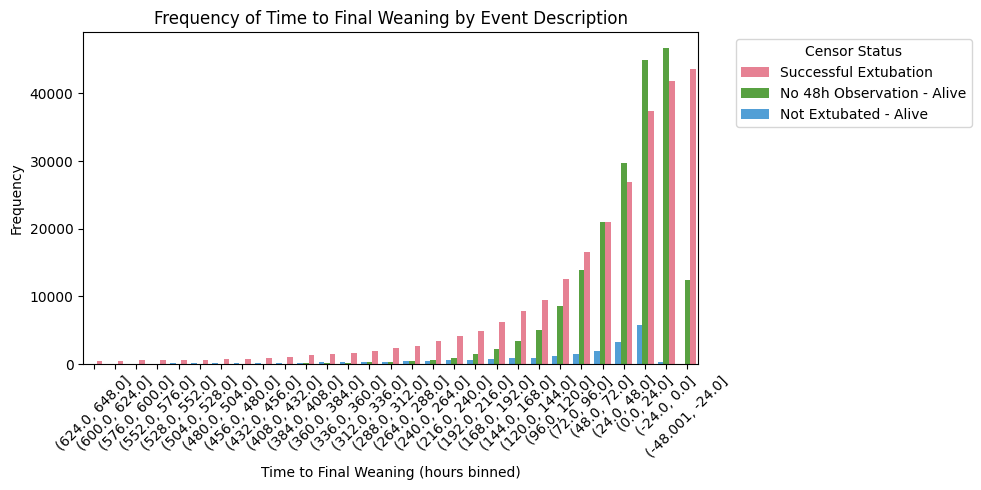

In [22]:

plt.figure(figsize=(10,5))  # Widen the figure to allow more space for each bar


# Define bin edges for hours; adjust the range and bin width as needed
bin_edges = np.arange(df_pred_without_failure['time_to_final_weaning'].min(), df_pred_without_failure['time_to_final_weaning'].max(), 24)

# Bin the 'time_to_event' data
df_pred_without_failure['time_to_final_weaning_binned'] = pd.cut(df_pred_without_failure['time_to_final_weaning'], bins=bin_edges, include_lowest=True)

# Choose a color palette with enough contrast
palette = sns.color_palette('husl', n_colors=df_pred_without_failure['event_description'].nunique())

# Create the count plot
sns.countplot(data=df_pred_without_failure, x='time_to_final_weaning_binned', hue='event_description', palette=palette)

plt.gca().invert_xaxis()  # Invert the x-axis on the current Axes object
# Improve the x-axis
plt.xticks(rotation=45)  # Rotate the labels for better legibility
plt.xlabel('Time to Final Weaning (hours binned)')
plt.ylabel('Frequency')
plt.title('Frequency of Time to Final Weaning by Event Description')

# Move the legend outside the plot to avoid covering the bars
plt.legend(title='Censor Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()  # Adjust the layout
plt.show()


In [24]:
df_pred_without_failure[df_pred_without_failure.time_to_final_weaning<=120].event_description.value_counts()

event_description
Successful Extubation         199868
No 48h Observation - Alive    177356
Not Extubated - Alive          13872
Name: count, dtype: int64

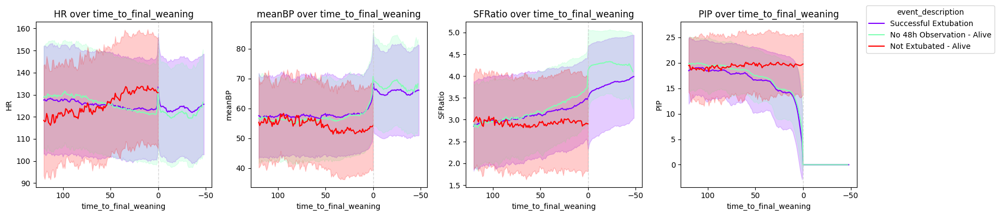

In [25]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[df_pred_without_failure.time_to_final_weaning<=120], 
    group_column='event_description', 
    numerical_cols=['HR', 'meanBP', 'SFRatio', 'PIP'], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning'
)

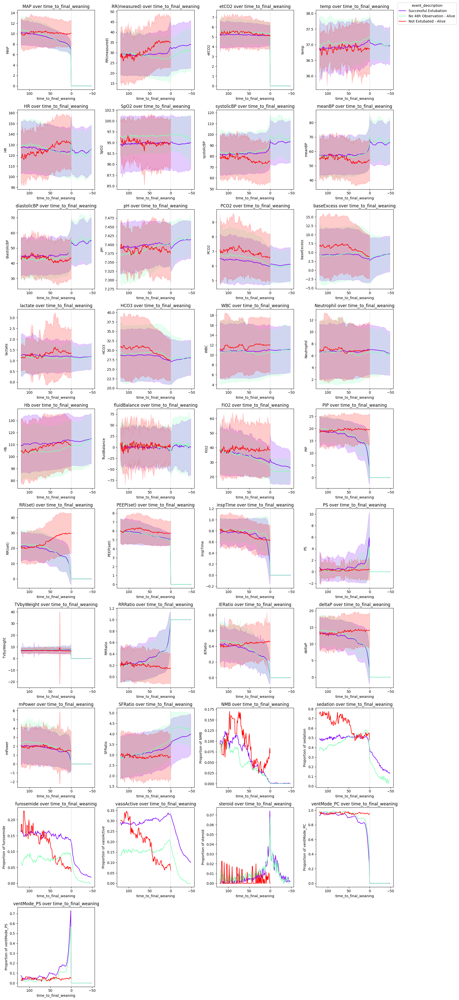

In [26]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[df_pred_without_failure.time_to_final_weaning<=120], 
    group_column='event_description', 
    numerical_cols=numerical_cols_tmp, 
    categorical_cols=categoric_cols_tmp, 
    hours_col='time_to_final_weaning'
)

In [27]:
from sklearn.linear_model import LinearRegression

epsilon = 1e-8

def compute_cv_and_slope(df_group):
    def shift_column_positive(df, column_name):
        # Calculate the minimum value of the column
        min_value = df[column_name].min()

        # If the minimum value is negative, shift the column by its absolute value
        if min_value < 0:
            df[column_name] += abs(min_value)

        return df
    
    # Ensure the group is sorted by timestamp if not already
    df_group = df_group.sort_values('timestamp').set_index('timestamp')    
    
    window = 12
    min_periods = 6
        
    for col in [x for x in numerical_cols_tmp if x not in ['timestamp']]:
        df_group = shift_column_positive(df_group, col)
        # Compute rolling standard deviation and mean
        rolling_std = df_group[col].rolling(window=window, min_periods=min_periods).std()
        rolling_mean = df_group[col].rolling(window=window, min_periods=min_periods).mean()
        rolling_scaler =  window / df_group[col].rolling(window=window, min_periods=min_periods).count()

        # Compute CV with epsilon to avoid division by zero
        df_group[f'cv_{col}'] = rolling_std / np.abs(rolling_mean + epsilon) * np.sqrt(rolling_scaler)

        # Compute slope using linear regression
        def compute_slope(x):
            start_value = x.iloc[0]
            end_value = x.iloc[-1]
            slope = (end_value - start_value) / len(x)
            return slope

        df_group[f'slope_{col}'] = df_group[col].rolling(window=window, min_periods=min_periods).apply(compute_slope)

        
    # Keep the timestamp in the resulting DataFrame
    df_group = df_group.reset_index()
    df_group = df_group.ffill().bfill()
    return df_group

# Apply the function to compute CV and slope for each encounterId for the numerical features
df_pred_without_failure = df_pred_without_failure.groupby('encounterId', as_index=False).apply(compute_cv_and_slope).reset_index(drop=True)




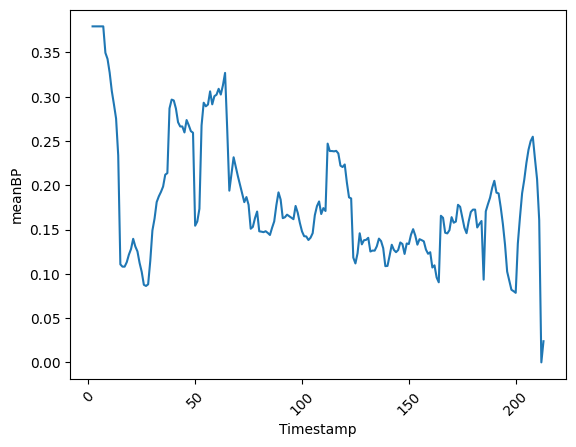

In [28]:
# Examine per subject
measure = 'meanBP'

encounter_data = df_pred_without_failure.loc[df_pred_without_failure.encounterId == '10028']

plt.plot(encounter_data['timestamp'], encounter_data[f'cv_{measure}'])
# plt.plot(encounter_data['timestamp'], encounter_data[f'{measure}'])

plt.xlabel('Timestamp')
plt.ylabel(f'{measure}')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

### Both suggesting a sever censoring issue, "Not Extubated" group is a bit more unpredictable? Also the waveshape might be a reflect of hospital staffing

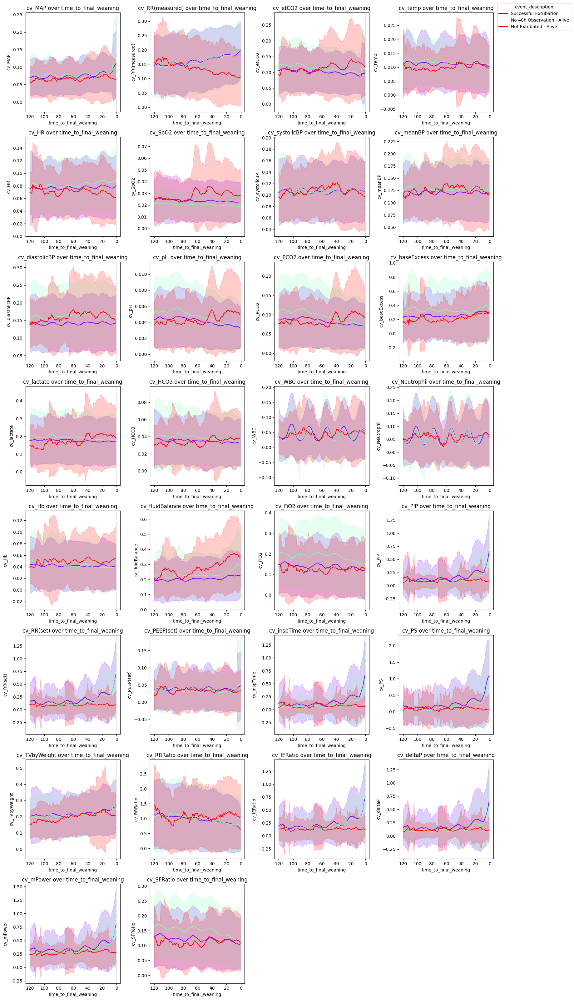

In [30]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning<=120) & 
                              (df_pred_without_failure.time_to_final_weaning>0)], 
    group_column='event_description', 
    numerical_cols=[f'cv_{col}' for col in numerical_cols_tmp], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning',
#     y_scaler=[0,0.5]
)

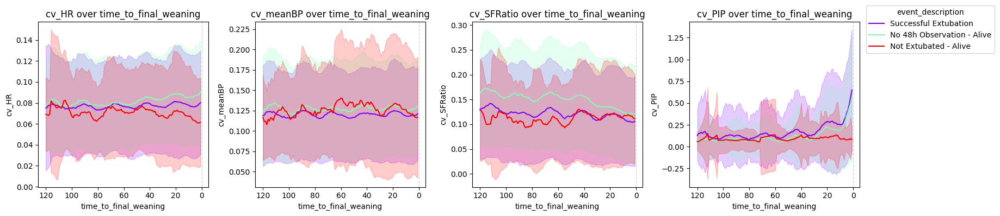

In [31]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning<=120) & 
                              (df_pred_without_failure.time_to_final_weaning>0)], 
    group_column='event_description', 
    numerical_cols=[f'cv_{col}' for col in ['HR', 'meanBP', 'SFRatio', 'PIP']], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning',
#     y_scaler=[0,0.5]
)

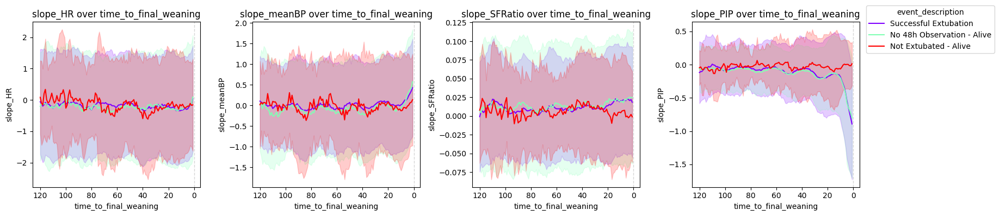

In [32]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning<=120) & 
                              (df_pred_without_failure.time_to_final_weaning>0)], 
    group_column='event_description', 
    numerical_cols=[f'slope_{col}' for col in ['HR', 'meanBP', 'SFRatio', 'PIP']], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning',
#     y_scaler=[0,0.5]
)



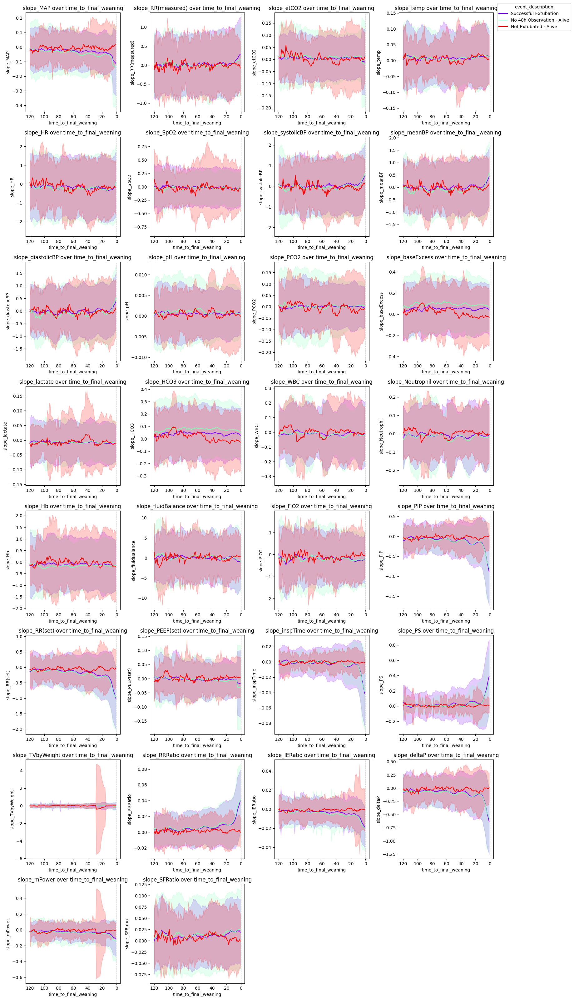

In [33]:

plot_grouped_feature_variation(
    df=df_pred_without_failure[(df_pred_without_failure.time_to_final_weaning<=120) & 
                              (df_pred_without_failure.time_to_final_weaning>0)], 
    group_column='event_description', 
    numerical_cols=[f'slope_{col}' for col in numerical_cols_tmp], 
    categorical_cols=[], 
    hours_col='time_to_final_weaning',
#     y_scaler=[0,0.5]
)

### The indicator seems correlated with ventilation measures well, but not physios

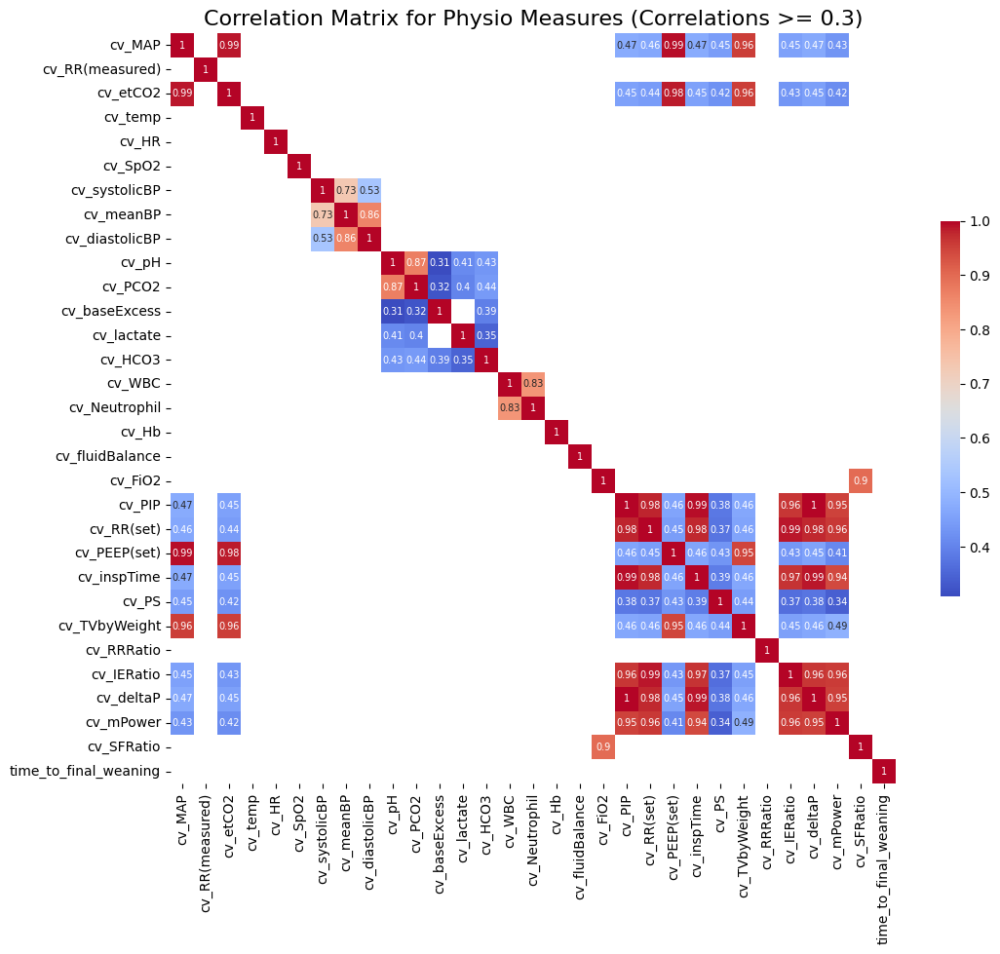

In [34]:

# Compute the correlation matrix
corr_matrix = df_pred_without_failure[[f'cv_{col}' for col in numerical_cols_tmp]+\
                       ['time_to_final_weaning']].corr(method='pearson') 

# Define correlation threshold
threshold = 0.3

# Create a mask for correlations that surpass the threshold
mask = np.abs(corr_matrix) >= threshold

# Apply the mask to the correlation matrix
filtered_corr_mat = corr_matrix[mask]

# Plot the filtered correlation matrix as a heatmap with adjusted font size
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(filtered_corr_mat, annot=True, cmap='coolwarm', annot_kws={"size": 7}, cbar_kws={'shrink': .5})

plt.title("Correlation Matrix for Physio Measures (Correlations >= " + str(threshold) + ")", fontsize=16)
plt.xticks(fontsize=10, rotation=90)  # Rotate x-axis labels and set fontsize
plt.yticks(fontsize=10, rotation=0)  # Rotate y-axis labels and set fontsize

plt.show()